# Adding a background map to plots
This example shows how you can add a background basemap to plots created with the geopandas .plot() method. This makes use of the contextily package to retrieve web map tiles from several sources (OpenStreetMap, CartoDB). Also have a look at contextily’s introduction guide for possible new features not covered here.

In [1]:
import geopandas
import geodatasets
import contextily as cx

Let’s use the NYC borough boundary data that is available in geopandas datasets. Plotting this gives the following result:

Extracting 'nybb_16a/nybb.shp' from '/Users/ulrike_imac_air/Library/Caches/geodatasets/nybb_16a.zip' to '/Users/ulrike_imac_air/Library/Caches/geodatasets/nybb_16a.zip.unzip'
Extracting 'nybb_16a/nybb.shx' from '/Users/ulrike_imac_air/Library/Caches/geodatasets/nybb_16a.zip' to '/Users/ulrike_imac_air/Library/Caches/geodatasets/nybb_16a.zip.unzip'
Extracting 'nybb_16a/nybb.dbf' from '/Users/ulrike_imac_air/Library/Caches/geodatasets/nybb_16a.zip' to '/Users/ulrike_imac_air/Library/Caches/geodatasets/nybb_16a.zip.unzip'
Extracting 'nybb_16a/nybb.prj' from '/Users/ulrike_imac_air/Library/Caches/geodatasets/nybb_16a.zip' to '/Users/ulrike_imac_air/Library/Caches/geodatasets/nybb_16a.zip.unzip'


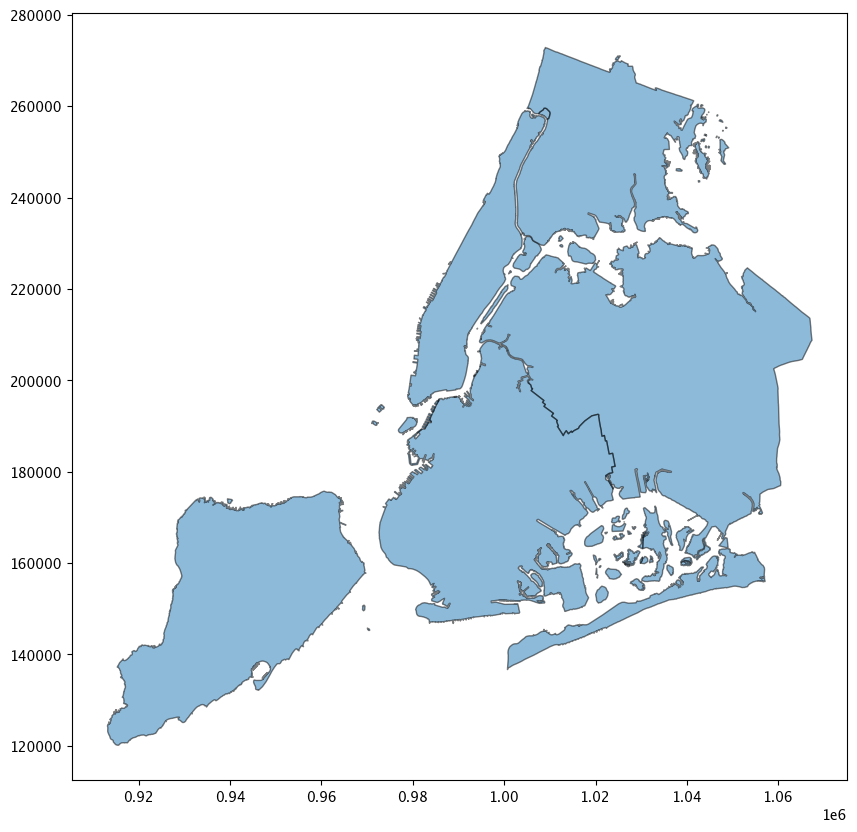

In [2]:

df = geopandas.read_file(geodatasets.get_path("nybb"))
ax = df.plot(figsize=(10, 10), alpha=0.5, edgecolor="k")

Matching coordinate systems
Before adding web map tiles to this plot, we first need to ensure the coordinate reference systems (CRS) of the tiles and the data match. Web map tiles are typically provided in Web Mercator (EPSG 3857), so let us first check what CRS our NYC boroughs are in:

In [11]:
df.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US survey foot)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

Now we know the CRS do not match, so we need to choose in which CRS we wish to visualize the data: either the CRS of the tiles, the one of the data, or even a different one.

The first option to match CRS is to leverage the to_crs method of GeoDataFrames to convert the CRS of our data, here to Web Mercator:

In [5]:
df_wm = df.to_crs(epsg=3857)

We can then use add_basemap function of contextily to easily add a background map to our plot:

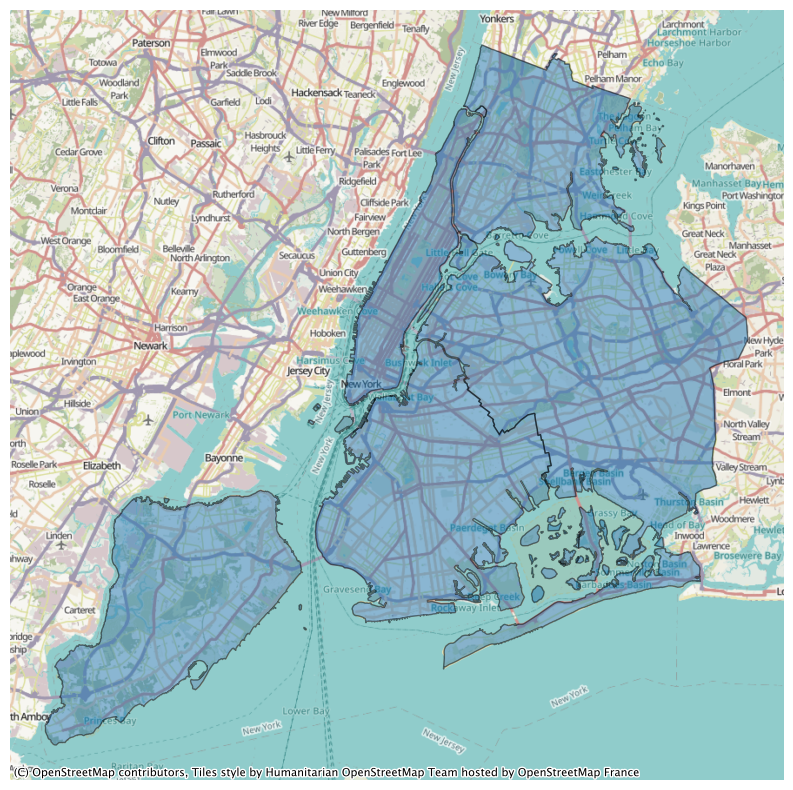

In [16]:
ax = df_wm.plot(figsize=(10, 10), alpha=0.5, edgecolor="k")
ax.set_axis_off()

cx.add_basemap(ax)

If we want to convert the CRS of the tiles instead, which might be advisable for large datasets, we can use the crs keyword argument of add_basemap as follows:

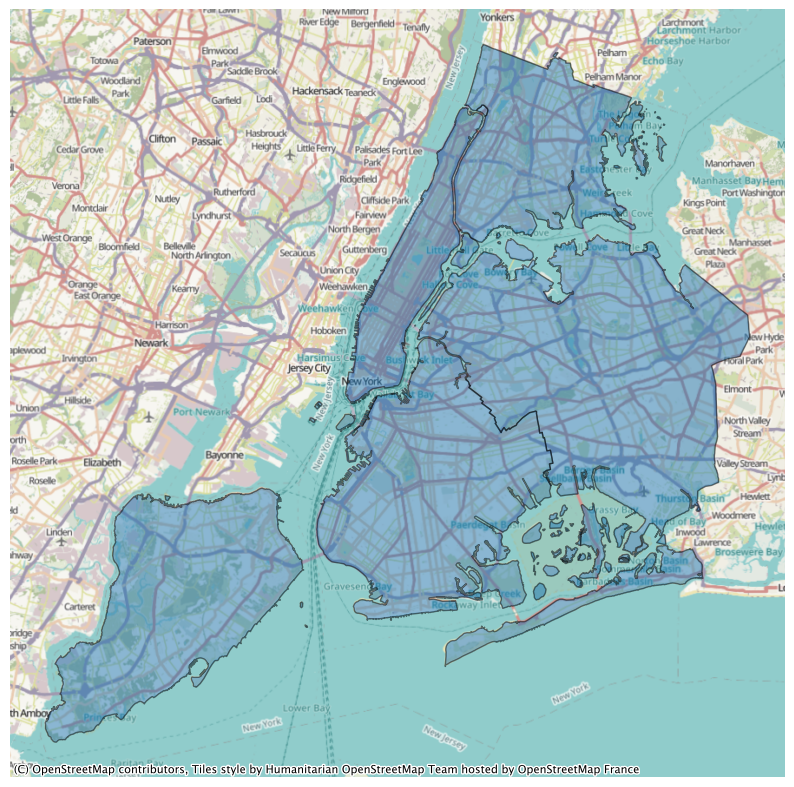

In [15]:
ax = df.plot(figsize=(10, 10), alpha=0.5, edgecolor="k")
ax.set_axis_off()

cx.add_basemap(ax, crs=df.crs)

This reprojects map tiles to a target CRS which may in some cases cause a loss of sharpness. See contextily’s guide on warping tiles for more information on the subject.

Controlling the level of detail
We can control the detail of the map tiles using the optional zoom keyword (be careful to not specify a too high zoom level, as this can result in a large download).:

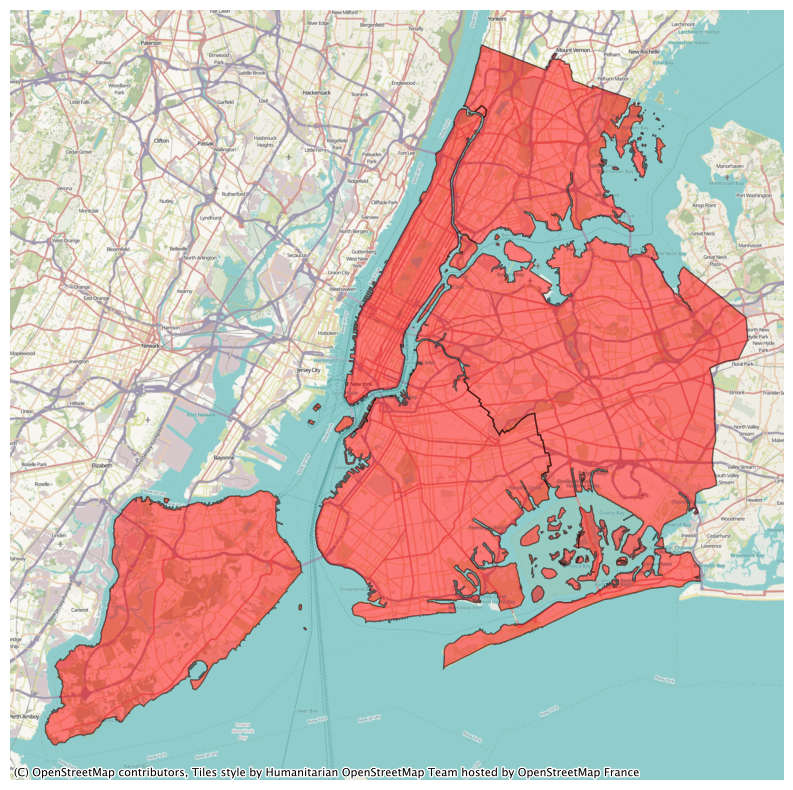

In [14]:
ax = df_wm.plot(figsize=(10, 10), alpha=0.5, edgecolor="k", color="red")
ax.set_axis_off()

cx.add_basemap(ax, zoom=12)

Choosing a different style
By default, contextily uses the OpenStreetMap HOT style. We can specify a different style using cx.providers:

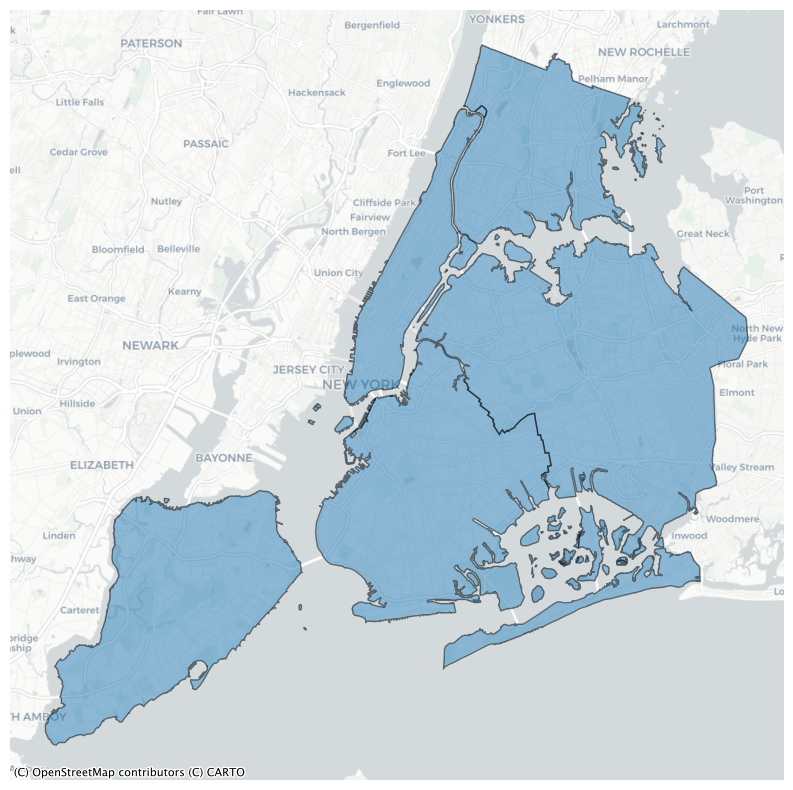

In [10]:
ax = df_wm.plot(figsize=(10, 10), alpha=0.5, edgecolor="k")
cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)
ax.set_axis_off()

Adding labels as an overlay
Sometimes, when you plot data on a basemap, the data will obscure some important map elements, such as labels, that you would otherwise want to see unobscured. Some map tile providers offer multiple sets of partially transparent tiles to solve this, and contextily will do its best to auto-detect these transparent layers and put them on top.

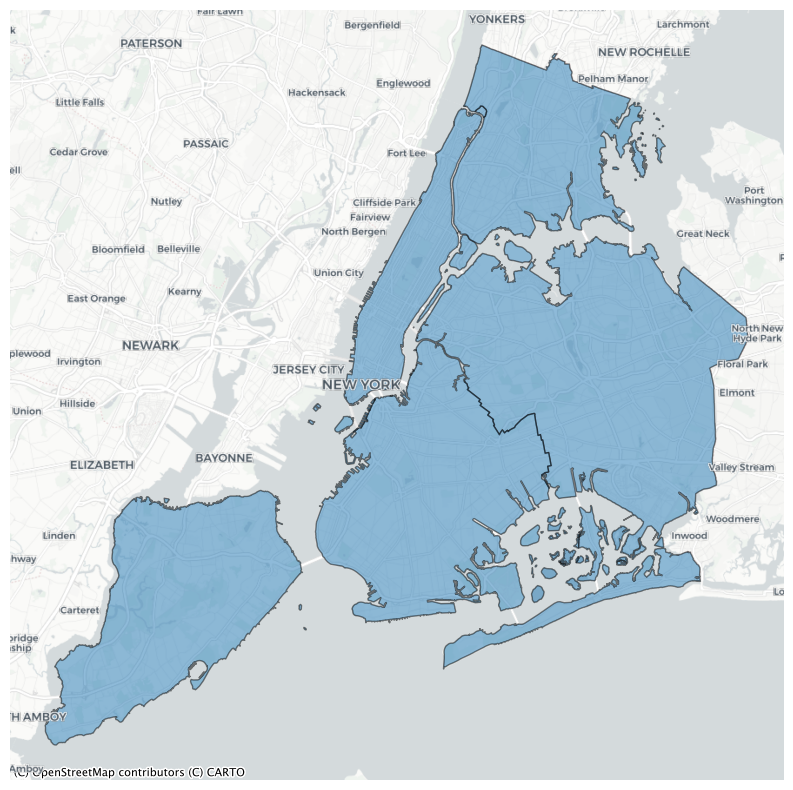

In [13]:
ax = df_wm.plot(figsize=(10, 10), alpha=0.5, edgecolor="k")
ax.set_axis_off()

cx.add_basemap(ax, source=cx.providers.CartoDB.PositronNoLabels)
cx.add_basemap(ax, source=cx.providers.CartoDB.PositronOnlyLabels)

By splitting the layers like this, you can also independently manipulate the level of zoom on each layer, for example to make labels larger while still showing a lot of detail.

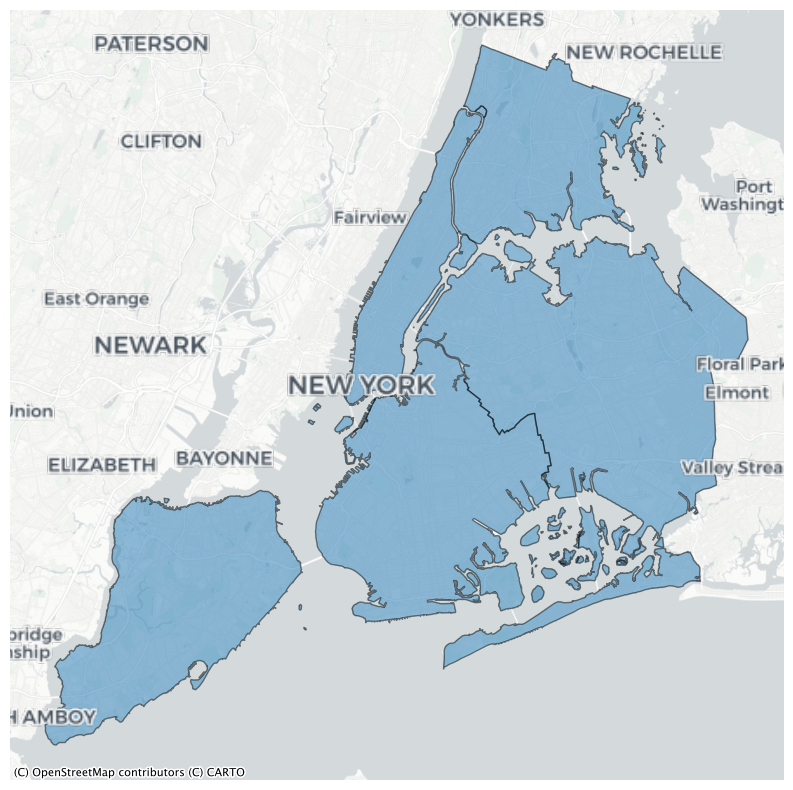

In [12]:
ax = df_wm.plot(figsize=(10, 10), alpha=0.5, edgecolor="k")

ax.grid(False)  # ✅ turn grid off on THIS axes
ax.set_axis_off()

cx.add_basemap(
    ax,
    source=cx.providers.CartoDB.PositronNoLabels,
    zoom=12
)
cx.add_basemap(
    ax,
    source=cx.providers.CartoDB.PositronOnlyLabels,
    zoom=10
)

Leipzig

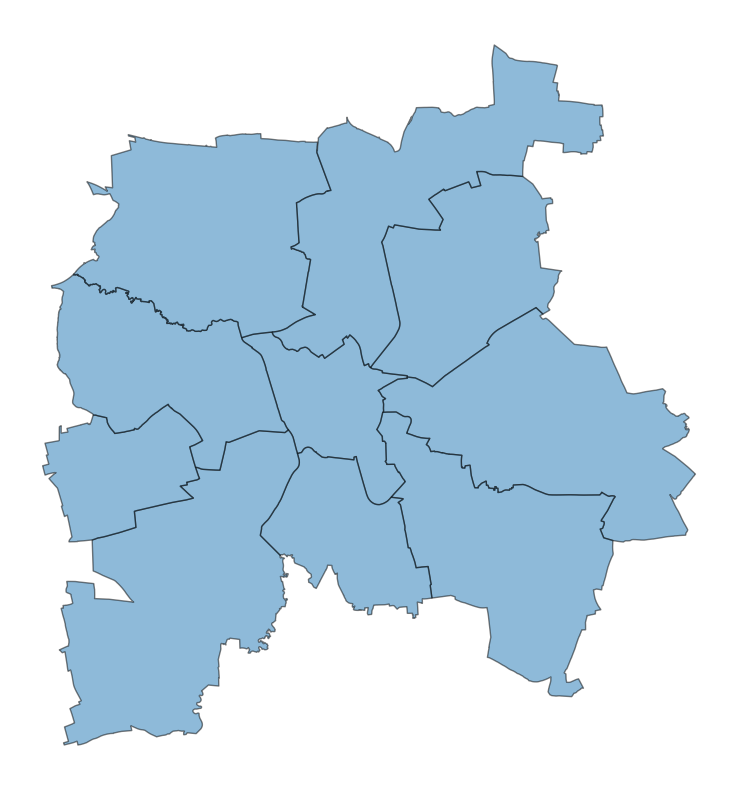

In [20]:
import geopandas as gpd

leipzig_gdf = gpd.read_file("/Users/ulrike_imac_air/projects/maps/Shapefiles/leipzig.json")

# Plot Leipzig
ax = leipzig_gdf.plot(figsize=(10, 10), alpha=0.5, edgecolor="k")
ax.set_axis_off()


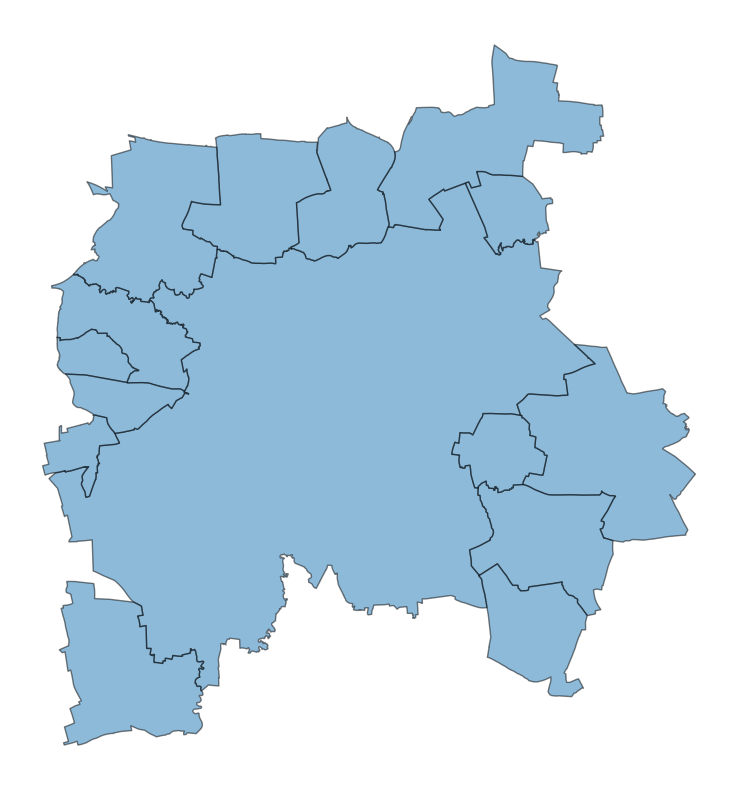

In [ ]:
import geopandas as gpd

leipzig_gdf02 = gpd.read_file("/Users/ulrike_imac_air/projects/maps/Shapefiles/Ortschaften.json")

# Plot Leipzig
ax = leipzig_gdf02.plot(figsize=(10, 10), alpha=0.5, edgecolor="k", color="yellow")
ax.set_axis_off()

In [25]:
leipzig_gdf02.crs

<Projected CRS: EPSG:25833>
Name: ETRS89 / UTM zone 33N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Europe between 12°E and 18°E: Austria; Denmark - offshore and offshore; Germany - onshore and offshore; Norway including Svalbard - onshore and offshore.
- bounds: (12.0, 46.4, 18.01, 84.42)
Coordinate Operation:
- name: UTM zone 33N
- method: Transverse Mercator
Datum: European Terrestrial Reference System 1989 ensemble
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [26]:
leipzig_gdf02_wm = leipzig_gdf02.to_crs(epsg=3857)

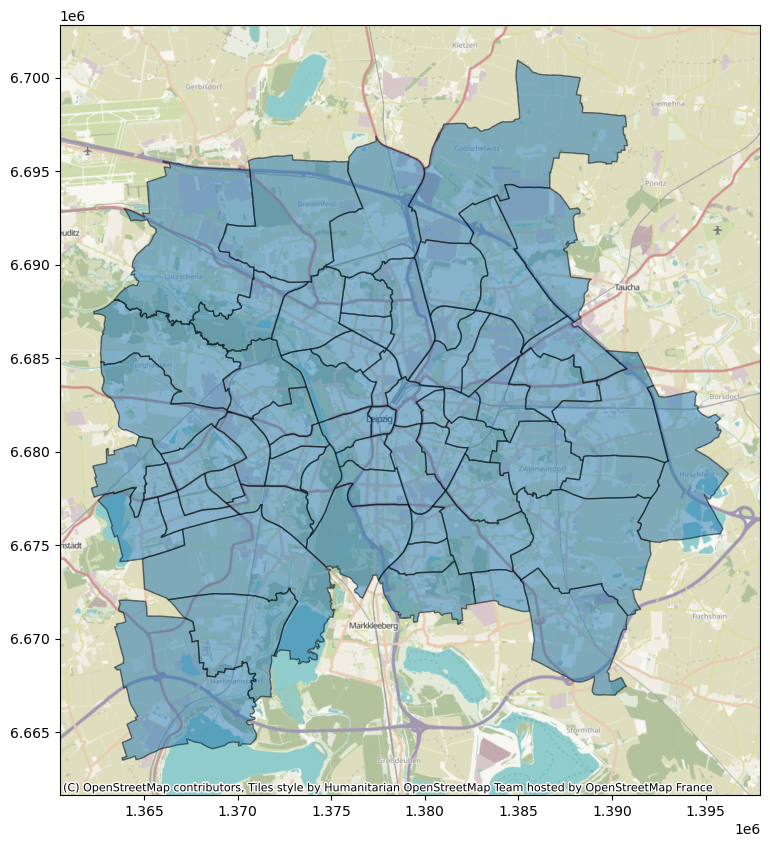

In [27]:
lx = leipzig_gdf02_wm.plot(figsize=(10, 10), alpha=0.5, edgecolor="k")
cx.add_basemap(lx)

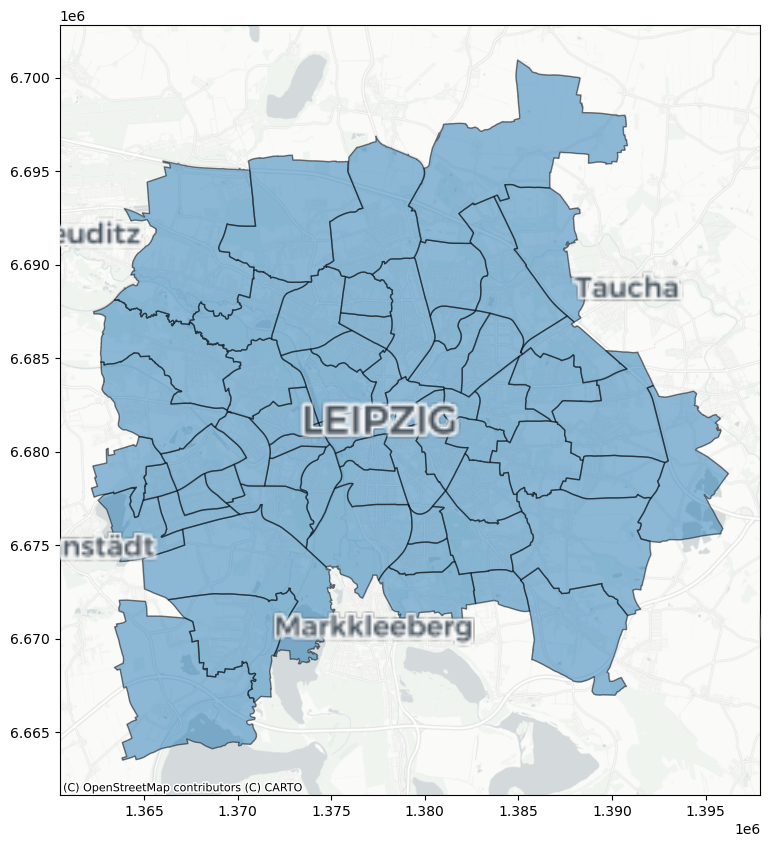

In [28]:
lx = leipzig_gdf02_wm.plot(figsize=(10, 10), alpha=0.5, edgecolor="k")
cx.add_basemap(lx, source=cx.providers.CartoDB.PositronNoLabels, zoom=12)
cx.add_basemap(lx, source=cx.providers.CartoDB.PositronOnlyLabels, zoom=10)

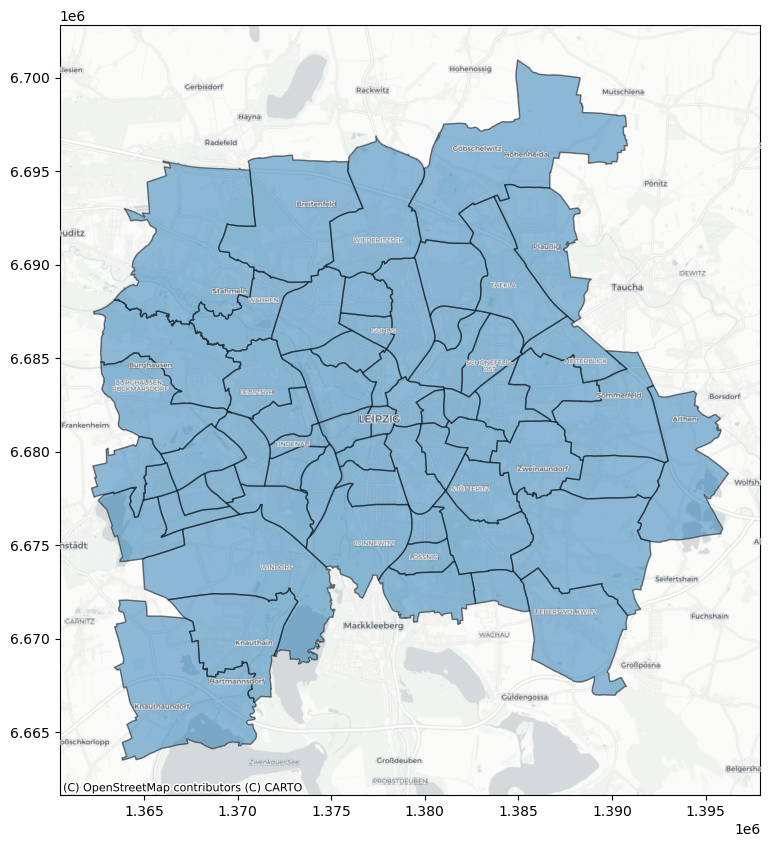

In [29]:
lx = leipzig_gdf02_wm.plot(figsize=(10, 10), alpha=0.5, edgecolor="k")
cx.add_basemap(lx, source=cx.providers.CartoDB.PositronNoLabels)
cx.add_basemap(lx, source=cx.providers.CartoDB.PositronOnlyLabels)

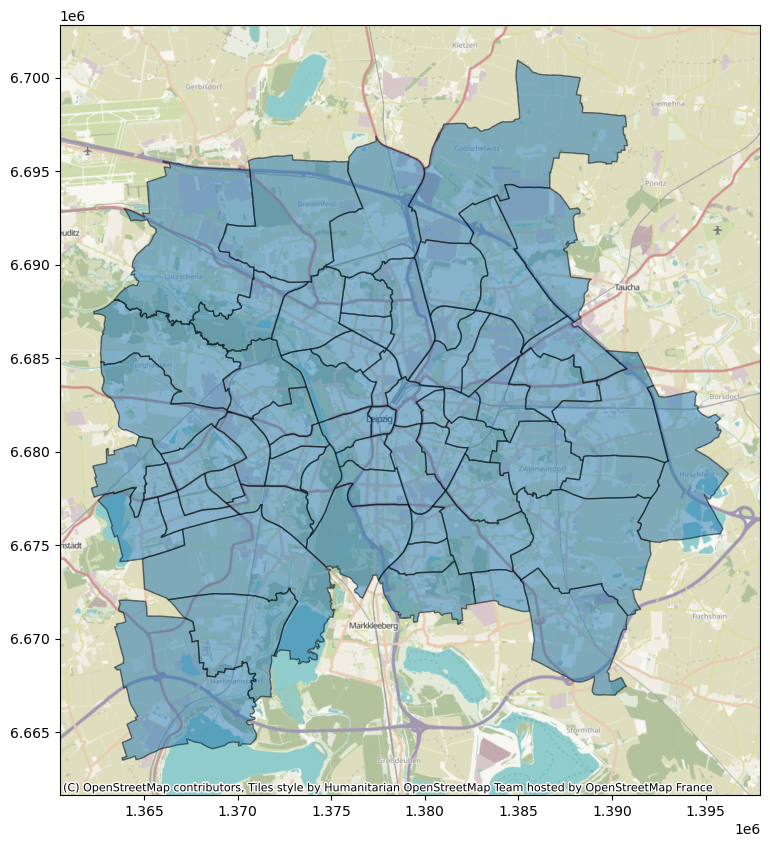

In [30]:
lx = leipzig_gdf02_wm.plot(figsize=(10, 10), alpha=0.5, edgecolor="k")
cx.add_basemap(lx, zoom=12)

San Francisco

DriverError: /Users/ulrike_imac_air/Downloads/Ortsteile_Leipzig_UTMBay_Area_County_Polygons_20240727.csv: No such file or directory